In [1]:
import numpy as np
import scanpy as sc


In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy
import os
import scipy.io as sio


In [3]:
sample = 'NGN2iN_TF_batch12_combined'

In [6]:
adata1 = sc.read_h5ad("adata/NGN2iN_TF_batch12_combined_predicted_filtered_doublets.h5ad")

In [7]:
adata = adata1
adata.obs_names_make_unique()

In [8]:
adata.obs['sample'] = adata.obs['run']

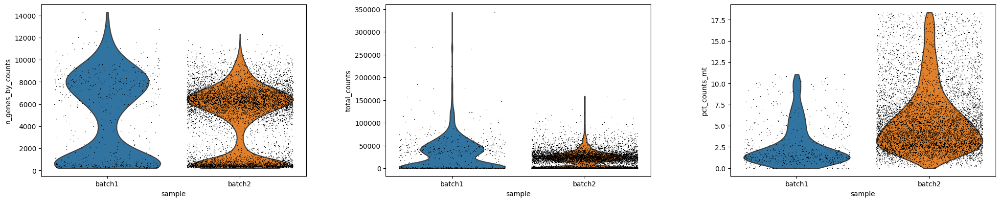

In [9]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],groupby='sample',
             jitter=0.4, multi_panel=True)


In [10]:
sc.pp.filter_genes(adata, min_cells=3)
adata.raw = adata
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts']) #had a big effect in first clustering
sc.pp.scale(adata, max_value=10)

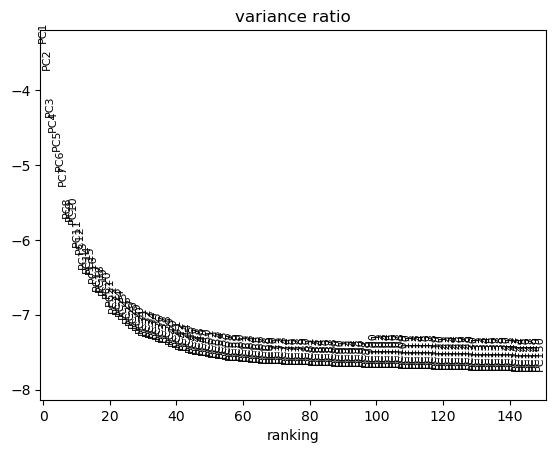

In [11]:
sc.tl.pca(adata, svd_solver='arpack',n_comps=150)
sc.pl.pca_variance_ratio(adata, log=True,n_pcs=150)

In [13]:
adata.write_h5ad("scanpy/"+sample+"_scaled.h5ad")

In [14]:
from threadpoolctl import threadpool_limits
with threadpool_limits(limits=50, user_api='blas'):
    sc.pp.neighbors(adata, n_neighbors=30, n_pcs=20)
    sc.tl.umap(adata)
    sc.tl.tsne(adata)

In [15]:
adata.write_h5ad("scanpy/"+sample+"_dr.h5ad")

In [16]:
sc.tl.leiden(adata,resolution=4,key_added='leiden_4')
sc.tl.leiden(adata,resolution=10,key_added='leiden_10')
sc.tl.leiden(adata,resolution=1,key_added='leiden_1')
sc.tl.leiden(adata,resolution=2,key_added='leiden_2')
sc.tl.leiden(adata,resolution=0.5,key_added='leiden_0.5')


In [17]:
adata.write_h5ad("scanpy/"+sample+"_dr_clustered.h5ad")

In [4]:
adata = sc.read_h5ad("scanpy/"+sample+"_dr_clustered.h5ad")

In [5]:
gene_list = ['FOXO3','HOXB3','MEIS2','NFATC1','NFIA','RARB','RXRG','SMAD9','TCF7L1','TCF7L2','TLX2','ZFHX3','MSX1','LHX9','PHOX2B','NEUROD1','LHX4','LEF1']

gene_list1 = ['NFIA','MEIS2','RXRG','RARB','HOXB3','SMAD9']
gene_list2 = [x for x in gene_list if x not in gene_list1]

In [6]:
import matplotlib as mpl
import matplotlib.pyplot as plt

In [7]:
adata

AnnData object with n_obs × n_vars = 9384 × 7333
    obs: 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'percent_mito', 'outlier', 'mt_outlier', 'doublet_score', 'predicted_doublet', 'FB_NFATC1', 'FB_LEF1', 'FB_LHX4', 'FB_NEUROD1', 'FB_PHOX2B', 'FB_LHX9', 'FB_MSX1', 'FB_ZFHX3', 'FB_TLX2', 'FB_TCF7L2', 'FB_TCF7L1', 'TF_NFATC1', 'TF_LEF1', 'TF_LHX4', 'TF_NEUROD1', 'TF_PHOX2B', 'TF_LHX9', 'TF_MSX1', 'TF_ZFHX3', 'TF_TLX2', 'TF_TCF7L2', 'TF_TCF7L1', 'TF_EGFP', 'x', 'y', 'label_NFATC1', 'label_LEF1', 'label_LHX4', 'label_NEUROD1', 'label_PHOX2B', 'label_LHX9', 'label_MSX1', 'label_ZFHX3', 'label_TLX2', 'label_TCF7L2', 'label_TCF7L1', 'FB_EGFP', 'FB_SMAD9', 'FB_RXRG', 'FB_RARB', 'FB_NFIA', 'FB_MEIS2', 'FB_HOXB3', 'TF_SMAD9', 'TF_RXRG', 'TF_RARB', 'TF_NFIA', 'TF_MEIS2', 'TF_HO

/links/groups/treutlein/USERS/jjans/anaconda3/envs/py_jjans_3.10_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/jjans/anaconda3/envs/py_jjans_3.10_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


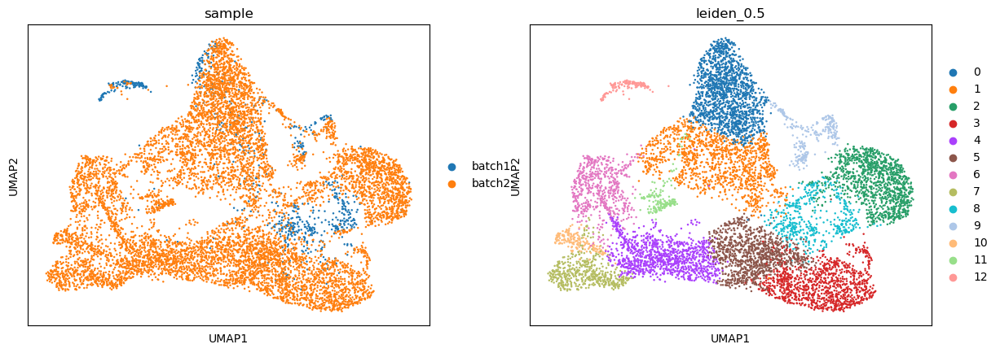

In [8]:
sc.pl.umap(adata,color=['sample',"leiden_0.5"])


/links/groups/treutlein/USERS/jjans/anaconda3/envs/py_jjans_3.10_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


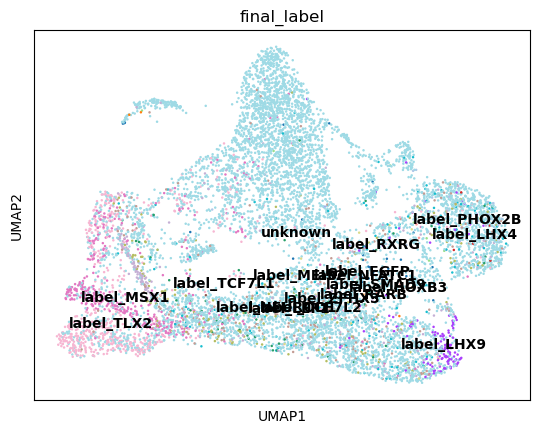

In [28]:
sc.pl.umap(adata,color='final_label',legend_loc='on data')

/links/groups/treutlein/USERS/jjans/anaconda3/envs/py_jjans_3.10_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


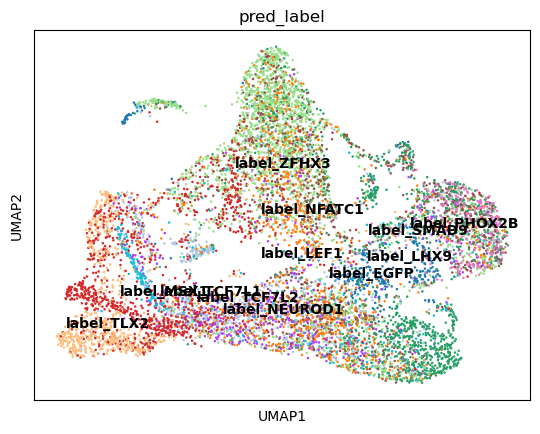

In [29]:
sc.pl.umap(adata,color='pred_label',legend_loc='on data')

In [26]:
adata.obs

,n_counts,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,...,label_sum,final_label,pred_label,run,sample,leiden_4,leiden_10,leiden_1,leiden_2,leiden_0.5
AAACGAAGTTACGTAC-1,5890.0,2850,7.955425,5890.0,8.681181,15.789474,592.0,6.385194,10.050934,122.0,...,0.0,unknown,label_EGFP,batch1,batch1,39,20,11,26,9
AAACGAATCCACTTTA-1,554.0,270,5.602119,554.0,6.318968,27.256318,29.0,3.401197,5.234657,232.0,...,0.0,unknown,label_ZFHX3,batch1,batch1,10,7,4,0,0
AAACGCTCAATAGAGT-1,43372.0,7764,8.957382,43372.0,10.677592,10.260076,972.0,6.880384,2.241077,5687.0,...,0.0,unknown,label_EGFP,batch1,batch1,24,53,9,15,8
AAAGGATTCACCTACC-1,2925.0,1220,7.107425,2925.0,7.981391,16.854701,8.0,2.197225,0.273504,997.0,...,0.0,unknown,label_ZFHX3,batch1,batch1,38,87,14,25,12
AAAGGATTCTCTCTTC-1,720.0,513,6.242223,720.0,6.580639,15.833333,4.0,1.609438,0.555556,129.0,...,0.0,unknown,label_NFATC1,batch1,batch1,38,57,14,25,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCATAACGGG-2,46837.0,8919,9.096051,46837.0,10.754450,7.876252,1102.0,7.005789,2.352841,3503.0,...,2.0,unknown,label_LHX9,batch2,batch2,15,40,0,6,3
TTTGTTGGTCATCGCG-2,21623.0,6112,8.718173,21623.0,9.981559,11.964112,1196.0,7.087574,5.531147,1389.0,...,0.0,unknown,label_LEF1,batch2,batch2,3,23,3,5,4
TTTGTTGGTCTACAAC-2,23331.0,6141,8.722906,23331.0,10.057581,15.957310,1353.0,7.210818,5.799151,910.0,...,0.0,unknown,label_TLX2,batch2,batch2,3,77,3,5,4
TTTGTTGGTCTGCATA-2,31058.0,6840,8.830689,31058.0,10.343644,10.551227,1747.0,7.466228,5.624959,4713.0,...,1.0,label_MSX1,label_MSX1,batch2,batch2,28,17,12,21,10


In [55]:
FB_det_genes = [x for x in FB_det_genes if not 'GFP' in x]

In [56]:
adata.obs[FB_det_genes].astype('bool').sum()

FB_NFATC1      174
FB_TCF7L1      193
FB_TCF7L2      241
FB_TLX2       2887
FB_ZFHX3        17
FB_MSX1       2755
FB_LHX9        567
FB_PHOX2B      249
FB_NEUROD1     457
FB_LHX4         17
FB_LEF1        150
dtype: int64

In [57]:
adata.obs[FB_det_genes].sum()

FB_NFATC1       520
FB_TCF7L1       458
FB_TCF7L2       705
FB_TLX2       21423
FB_ZFHX3         56
FB_MSX1       19782
FB_LHX9        2481
FB_PHOX2B      1083
FB_NEUROD1     1630
FB_LHX4          56
FB_LEF1         482
dtype: int64

In [58]:
adata.obs[TF_det_genes].astype('bool').sum()

TF_NFATC1     133
TF_TCF7L1     186
TF_TCF7L2     230
TF_TLX2       923
TF_ZFHX3       31
TF_MSX1       939
TF_LHX9       324
TF_PHOX2B      76
TF_NEUROD1    441
TF_LHX4        11
TF_LEF1       118
dtype: int64

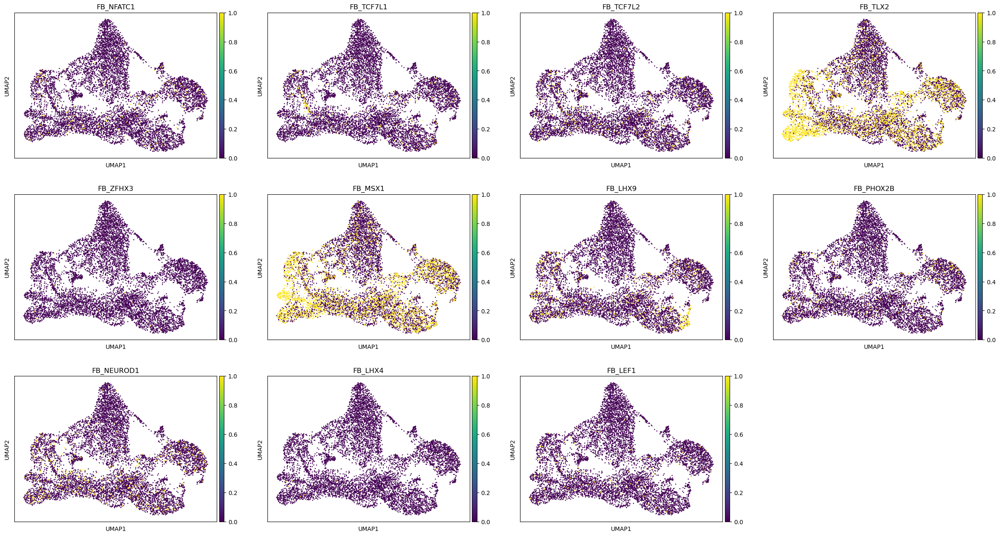

In [59]:
sc.pl.umap(adata,color=FB_det_genes,vmax=1,save='FB_detection_vmax1.png')

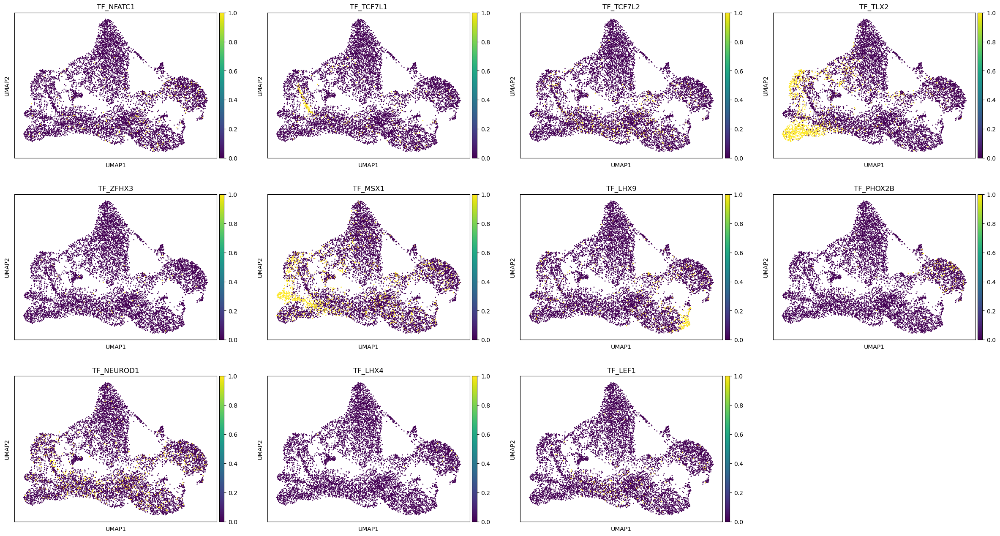

In [60]:
sc.pl.umap(adata,color=TF_det_genes,vmax=1,save='TF_detection_vmax1.png')

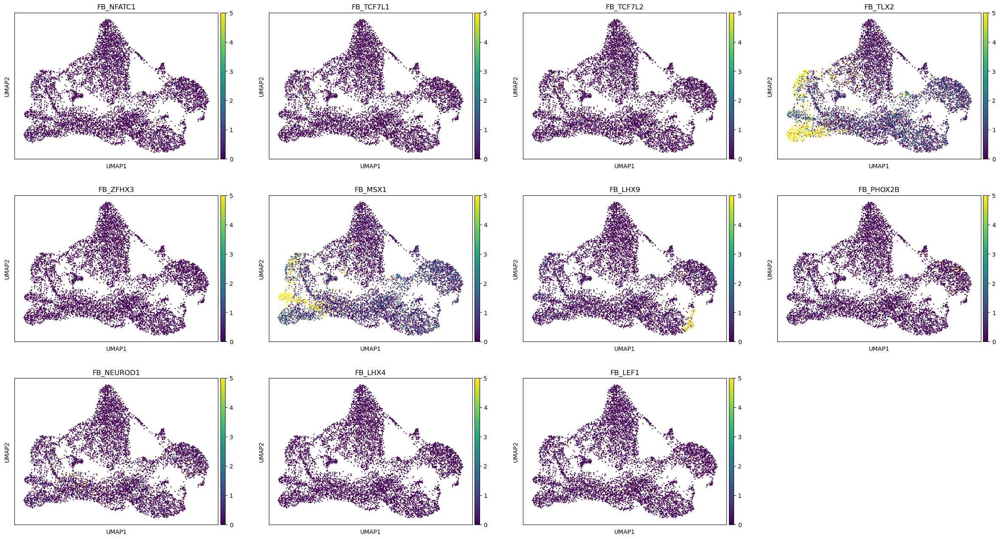

In [61]:
sc.pl.umap(adata,color=FB_det_genes,vmax=5,save='FB_detection_vmax5.png')

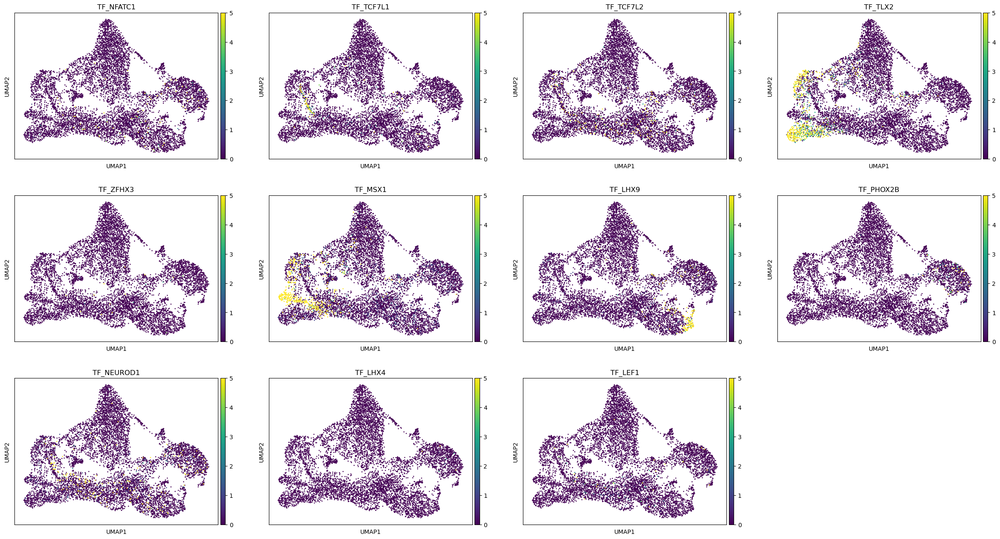

In [62]:
sc.pl.umap(adata,color=TF_det_genes,vmax=5,save='TF_detection_vmax5.png')

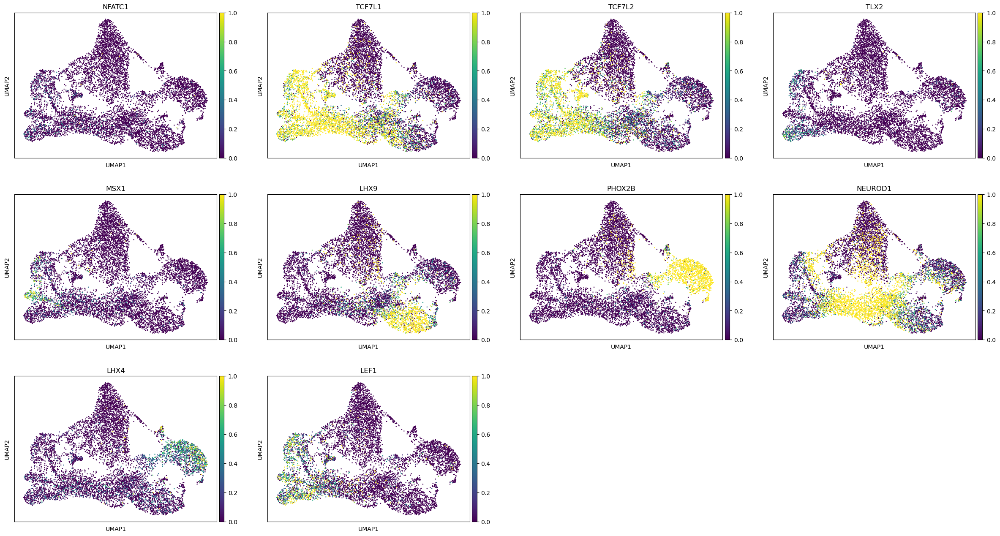

In [63]:
sc.pl.umap(adata,color=gene_list2_expr,vmax=1,save='TF_expr_vmax1.png')